<a href="https://colab.research.google.com/github/Meowmixforme/Squirrel-Red/blob/main/Notebooks/Squirrel_Red.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Loading the dataset from MongoDB


In [3]:
from google.colab import userdata
from pymongo import MongoClient
import pandas as pd

# Retrieve MongoDB URI from Colab Secrets
connection_string = userdata.get("SQUIRREL_RED")
if not connection_string:
    raise ValueError("MongoDB URI not found in Colab Secrets.")

# Connect to MongoDB
client = MongoClient(connection_string)

# Access database and collection
db = client["Red_Squirrel_TSSD_records"]
collection = db["Red_Squirrel_TSSD_records"]

# Retrieve and convert data
data = list(collection.find())
df = pd.DataFrame(data)

# Preview
print(df.head())



                        _id  \
0  65adf3ddd73671e8f265a314   
1  65adf3ded73671e8f265a339   
2  65adf3ded73671e8f265a369   
3  65adf3ded73671e8f265a334   
4  65adf3ded73671e8f265a33f   

                                 NBN Atlas record ID Occurrence ID Licence  \
0     b'\xff\xa7\xc8\xfe-*J\xac\xbe\xdfUo>^\xf7\xea'       DS17758   CC-BY   
1  b'\xfe\x80\xbd:x\xc5E\xd4\x96\xd9\xc78p\x8e\x8...        DS7168   CC-BY   
2        b'\xfdHRr\xfbFF\xdc\x99\x02\xa6\x1a\xabwZ/'       DS30027   CC-BY   
3          b'\xfe\xb9AU\x93\xf1@\xce\x97r8\r_VV\x01'      GR199796   CC-BY   
4    b'\xfelIF\x80[D\x8e\x92\x12\xdf\xda\xeb"\x83\r'       OS13993   CC-BY   

              Rightsholder   Scientific name    Taxon author  \
0  Scottish Wildlife Trust  Sciurus vulgaris  Linnaeus, 1758   
1  Scottish Wildlife Trust  Sciurus vulgaris  Linnaeus, 1758   
2  Scottish Wildlife Trust  Sciurus vulgaris  Linnaeus, 1758   
3  Scottish Wildlife Trust  Sciurus vulgaris  Linnaeus, 1758   
4  Scottish Wildlife Tru

The Scottish Squirrel Database has 47 columns. We are interested in Number of observations,

#1. *EDA*

Viewing the MongoDB collection information

In [4]:
collection

Collection(Database(MongoClient(host=['ac-w8wdyyv-shard-00-02.uv3sje7.mongodb.net:27017', 'ac-w8wdyyv-shard-00-01.uv3sje7.mongodb.net:27017', 'ac-w8wdyyv-shard-00-00.uv3sje7.mongodb.net:27017'], document_class=dict, tz_aware=False, connect=True, retrywrites=True, w='majority', authsource='admin', replicaset='atlas-irnl6f-shard-0', tls=True), 'Red_Squirrel_TSSD_records'), 'Red_Squirrel_TSSD_records')

The length of the dataset has 93119 values

In [5]:
length = len(df)

print(length)

93119


In [6]:
unique_vals = df['count'].unique()

print(unique_vals)

[1 2 5 3 6 4
 'Killiecrankie,,HumanObservation,present,Very dark speciemen,1\nDS26145,,FEWA CS2005.1,,The Scottish Squirrel Database,SWT,CC-BY,Scottish Wildlife Trust,Sciurus vulgaris,NBNSYS0000005108,,Accepted - considered correct,2004-07-28,J Graham,JMT,NR798654,,Torinturk,,HumanObservation,present,,1\nDS22431,,ARSG CS 2005.1,,The Scottish Squirrel Database,SWT,CC-BY,Scottish Wildlife Trust,Sciurus vulgaris,NBNSYS0000005108,,Accepted - considered correct,2004-07-30,MG,JMT,NS309034,,Kilkerran'
 None 10 9 7 8 20
 'Scone,,HumanObservation,present,,1\nDS23149,,RSSSa 2005.1,,The Scottish Squirrel Database,SWT,CC-BY,Scottish Wildlife Trust,Sciurus carolinensis,NHMSYS0000332764,,Accepted - considered correct,2002-09-07,Unknown,JMT,NY144692,,Kelhead,Kelhead'
 'Kirriemuir,,HumanObservation,present,4 young seen [Number seen = Presence],4\nDS24954,,SSBRC CS 2005.1,,The Scottish Squirrel Database,SWT,CC-BY,Scottish Wildlife Trust,Sciurus carolinensis,NHMSYS0000332764,,Accepted - considered corre

The columns contain many Id and licencing values or Scientific name of the red squirrel that won't be needed for the project.

In [ ]:
column_names = df.columns.tolist()

print(column_names)

['_id', 'NBN Atlas record ID', 'Occurrence ID', 'Licence', 'Rightsholder', 'Scientific name', 'Taxon author', 'Common name', 'Species ID (TVK)', 'Taxon Rank', 'Occurrence status', 'Start date', 'Start date day', 'Start date month', 'Start date year', 'OSGR', 'Latitude (WGS84)', 'Longitude (WGS84)', 'Coordinate uncertainty (m)', 'Determiner', 'count', 'Identification verification status', 'Basis of record', 'Survey key', 'Dataset name', 'Dataset ID', 'Data provider', 'Data provider ID', 'Institution code', 'Kingdom', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'OSGR 100km', 'OSGR 10km', 'OSGR 2km', 'OSGR 1km', 'Country', 'State/Province', 'Locality', 'Occurrence remarks', 'Abundance', 'Abundance scale', 'Sex', 'Life stage']


Location data, temporal data, count and the survey key are the columns we're interested in keeping.  

In [ ]:
columns_to_keep = ['Start date', 'Start date day', 'Start date month', 'Start date year', 'OSGR', 'Latitude (WGS84)', 'Longitude (WGS84)', 'Coordinate uncertainty (m)', 'count', 'Occurrence ID', 'Survey key', 'OSGR 100km', 'OSGR 10km', 'OSGR 2km',
                   'OSGR 1km', 'State/Province']

df = df.loc[:, columns_to_keep]


print(df.columns.tolist())

['Start date', 'Start date day', 'Start date month', 'Start date year', 'OSGR', 'Latitude (WGS84)', 'Longitude (WGS84)', 'Coordinate uncertainty (m)', 'count', 'Occurrence ID', 'Survey key', 'OSGR 100km', 'OSGR 10km', 'OSGR 2km', 'OSGR 1km', 'State/Province']


There are three values in State/Province

In [ ]:
unique_values = df['State/Province'].unique()
unique_count = df['State/Province'].nunique()

print(unique_values)
print(unique_count)

['Scotland' 'England' 'Wales']
3


We can see that Scotland has by far the most observations and it makes sense to only focus on this region.

In [ ]:
count = df['State/Province'].value_counts()
print(count)

State/Province
Scotland    93079
England        38
Wales           2
Name: count, dtype: int64


The project will be concentrating on Scotland, so England and Wales can be dropped as they don't contain enough sightings to make them relevant.

In [ ]:
df = df[df['State/Province'] == 'Scotland']

unique_values = df['State/Province'].unique()
unique_count = df['State/Province'].nunique()

print(unique_values)
print(unique_count)

['Scotland']
1


We can now drop the column 'State/Province' as there are only values for Scotland remaining

In [ ]:
df.drop('State/Province', axis=1, inplace=True)


There is no duplicated data

In [ ]:
df.duplicated().sum()

0


There are now 15 columns and 93079 rows in the dataset

In [ ]:
df.shape

(93079, 15)

count has 18 NA values, OSGR 2km	814 and OSGR 1km	816.
The coordinate data may be the most useful in this project

In [ ]:
df.isna().sum()

,0
Start date,0
Start date day,0
Start date month,0
Start date year,0
OSGR,0
Latitude (WGS84),0
Longitude (WGS84),0
Coordinate uncertainty (m),0
count,18
Occurrence ID,0


The first 5 values in the dataframe

In [ ]:
print(df.head())


   Start date  Start date day  Start date month  Start date year      OSGR  \
0  16/07/2000              16                 7             2000  NH922090   
1  12/07/2010              12                 7             2010    NO5198   
2  15/07/2006              15                 7             2006  NN025616   
3  10/07/2018              10                 7             2018    NY2369   
4  16/07/2016              16                 7             2016  NJ853015   

   Latitude (WGS84)  Longitude (WGS84)  Coordinate uncertainty (m) count  \
0         57.159619          -3.783060                        70.7     1   
1         57.074953          -2.801609                       707.1     1   
2         56.704684          -5.227014                        70.7     1   
3         55.014145          -3.197849                       707.1     1   
4         57.104680          -2.243467                        70.7     2   

  Occurrence ID          Survey key OSGR 100km OSGR 10km OSGR 2km OSGR 1km

'count' is an object and will need converting to an int.
The temporal data will need cleaning up.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 93079 entries, 0 to 93118
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Start date                  93079 non-null  object 
 1   Start date day              93079 non-null  int64  
 2   Start date month            93079 non-null  int64  
 3   Start date year             93079 non-null  int64  
 4   OSGR                        93079 non-null  object 
 5   Latitude (WGS84)            93079 non-null  float64
 6   Longitude (WGS84)           93079 non-null  float64
 7   Coordinate uncertainty (m)  93079 non-null  float64
 8   count                       93061 non-null  object 
 9   Occurrence ID               93079 non-null  object 
 10  Survey key                  93079 non-null  object 
 11  OSGR 100km                  93079 non-null  object 
 12  OSGR 10km                   93079 non-null  object 
 13  OSGR 2km                    92265 no

All days are included

In [ ]:
unique_values = df['Start date day'].unique()
unique_count = df['Start date day'].nunique()

print(unique_values)
print(unique_count)

[16 12 15 10  5 31 14 21 13  3 11  4 24 20  9  1 28 19 18 26 25 29 30 27
  2  8  7 22 23 17  6]
31


The first day of the month has the most sightings. This could be due to this being the day that many of the surveys were handed in.

In [ ]:
most_freq = df['Start date day'].value_counts().sort_values(ascending=False)

most_freq

,count
Start date day,
1,7624
15,3278
21,3259
24,3112
12,3092
22,3062
14,3041
20,3035
23,3030


All months of the year are included

In [ ]:
unique_SDM = df['Start date month'].unique()
print(unique_SDM)

[ 7 11 12  6  9  4  5  1  2  3 10  8]


There are no missing values

In [ ]:
null_count = df['Start date month'].isnull().sum()
print(null_count)

nan_count = df['Start date month'].isna().sum()
print(nan_count)

0
0


September, followed by April have the most sightings

In [ ]:
most_freq = df['Start date month'].value_counts().sort_values(ascending=False)

most_freq

,count
Start date month,
9,12043
4,11836
10,9824
3,9407
1,7767
5,7547
7,7359
6,7320
8,6072


At the very least the last 20 years of data is included.
Beyond that the years become more sporadic.

In [ ]:
unique_SDY = df['Start date year'].unique()
print(unique_SDY)

[2000 2010 2006 2018 2016 2013 2019 2020 2008 2007 2012 2017 1994 2015
 2021 2005 2004 1997 2009 2014 1995 2011 1998 2002 1993 2001 1996 1991
 1999 2003 1990 1984 1981 1905 1988 1980 1989 1975 1966 1960 1983 1992
 1976 1973 1985 1978 1986 1971 1977 1979 1954 1967 1982 1970 1987 1947
 1950 1972 1965 1959 1974 1969 1938]


A check for null values in 'Start date year' shows there are none


In [ ]:
nan_count = df['Start date year'].isna().sum()
print(nan_count)

null_count = df['Start date year'].isnull().sum()
print(null_count)

0
0


The top 10 years with the most sightings are also the last 10 years

In [ ]:
top_ten = df['Start date year'].value_counts().nlargest(10)

top_ten

,count
Start date year,
2020,17043
2019,9312
2018,8295
2017,5946
2021,5593
2015,5388
2016,4917
2014,4181
2012,3853


The earliest year recorded is 1905

In [ ]:
earliest = df['Start date year'].min()

earliest

1905

The years with the least sightings are in the 50s and 70s

In [ ]:
bottom_ten = df['Start date year'].value_counts().nsmallest(10)

bottom_ten

,count
Start date year,
1973,1
1947,1
1954,1
1972,1
1965,1
1959,1
1974,1
1969,1
1950,2


Renaming year, day, month to be simpler to work with

In [ ]:
df.rename(columns={'Start date year':'year'}, inplace=True)
df.rename(columns={'Start date month':'month'}, inplace=True)
df.rename(columns={'Start date day':'day'}, inplace=True)

Creating a datetime variable of 'Date'

In [ ]:
df['Date'] = pd.to_datetime(df[['day','month','year']], format='%d-%m-%y')

Confirming the 'Date' is in the correct format

In [ ]:
df['Date']

,Date
0,2000-07-16
1,2010-07-12
2,2006-07-15
3,2018-07-10
4,2016-07-16
...,...
93114,2020-04-03
93115,2018-04-15
93116,2015-04-29
93117,1997-04-10


Converting 'count' to be numeric and coercing errors

In [ ]:
df['count'] =pd.to_numeric(df['count'], errors='coerce')

'count' is now of datatype float

In [ ]:
dtype_A = df['count'].dtype

print(dtype_A)

float64


Filling in the NA values with the mean of the column.
Converting 'count' to be of type int

In [ ]:
df['count'] = df['count'].fillna(df['count'].mean())
df['count'] = df['count'].astype(int)

In [ ]:
dtype_A = df['count'].dtype

print(dtype_A)

int64


There are a large range of values

In [ ]:
unique_vals = df['count'].unique()

print(unique_vals)

[   1    2    5    3    6    4   10    9    7    8   20  112   12   25
   41   36   50   13   44  118   11   16   30   28   15   14  120  181
   39   61   19  130  125   17   18 1042   34   52   23   51  111   32
   45  109  500   31  203   21   22  551   27  392   33]


The dataset is still the same length

In [ ]:
length = len(df)

print(length)

93079


The mean is around 1

In [ ]:
average_value = df['count'].mean()

print(average_value)

1.3787965061936633


around 75% or more of the data are single sightings

In [ ]:
count_data = df['count'].describe()

print(count_data)

count    93079.000000
mean         1.378797
std          4.720172
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max       1042.000000
Name: count, dtype: float64


A single sighting of 1042 is likely from a large

In [ ]:
highest_observation = df['count'].max()

print("Highest observation is:", highest_observation)

Highest observation is: 1042


A filter of the survey keys show that many of the large surveys do indeed have the first day of the month.

In [ ]:
sorted_df = df.sort_values(by='count', ascending=False)

# Select the top 10 rows
top_10 = sorted_df.head(10)

# Display the top 10 survey keys with their counts
print(top_10[['Survey key', 'count', 'Date']])

           Survey key  count       Date
43362    RSSSa CT2006   1042 2006-01-01
79406    RSSSa CT2007    551 2007-01-01
62848    RSSSa CT2007    500 2007-01-01
83347    RSSSa CT2006    392 2006-01-01
69488    RSSSa CT2006    203 2006-01-01
25444  NESB CS 2005.1    181 2002-11-01
33327  PW156 CT2007.1    130 2005-12-01
37588    RSSSa CT2007    125 2007-01-01
24463    RSSSa CT2006    120 2006-01-01
8520     RSSSa CT2006    118 2006-01-01


Visually most observations are 1 and the rest are seen as outliers. The outliers are quite likely surveys

<Axes: xlabel='count'>

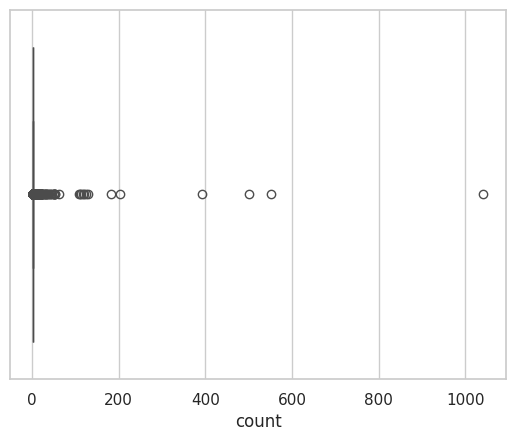

In [ ]:
import seaborn as sns
import matplotlib as plt
import pandas as pd

sns.boxplot(x = df['count'], data = df)

<Axes: xlabel='count'>

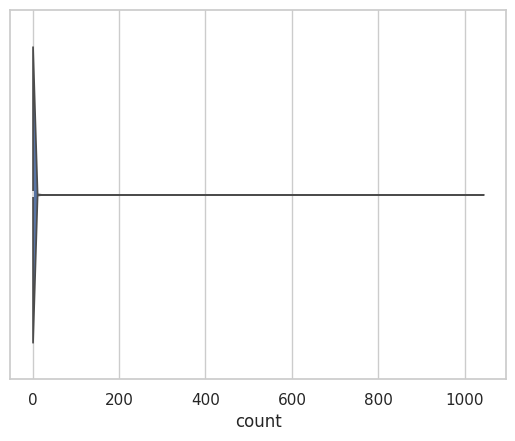

In [ ]:
sns.violinplot(x=df['count'])


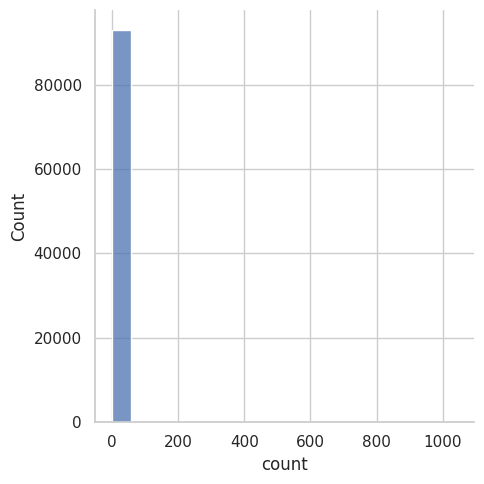

In [ ]:
sns.displot(df['count'])


The first day of the month has by far the most observations.

    day  count
0     1  14974
1     2   3857
2     3   3504
3     4   3791
4     5   3556
5     6   3453
6     7   3545
7     8   3621
8     9   3493
9    10   3868
10   11   3738
11   12   4094
12   13   3714
13   14   3992
14   15   4465
15   16   3752
16   17   3804
17   18   3932
18   19   3734
19   20   4028
20   21   4429
21   22   4138
22   23   4012
23   24   4150
24   25   3923
25   26   3784
26   27   3957
27   28   3709
28   29   3642
29   30   3699
30   31   1979


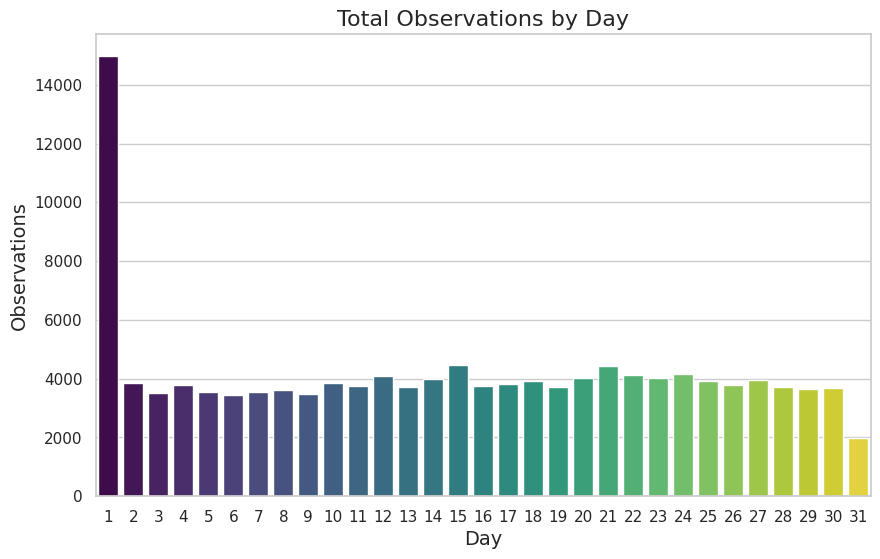

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

count_by_day = df.groupby('day')['count'].sum().reset_index()

print(count_by_day)

sns.set(style="whitegrid")

# bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='day', y='count', data=count_by_day, palette='viridis', hue = 'day', legend=False)

# titles and labels
plt.title('Total Observations by Day', fontsize=16)
plt.xlabel('Day', fontsize=14)
plt.ylabel('Observations', fontsize=14)

# Show plot
plt.show()

    month  count
0       1  15112
1       2   6607
2       3  11979
3       4  14401
4       5  10211
5       6   9661
6       7   9648
7       8   7981
8       9  16420
9      10  13326
10     11   7621
11     12   5370


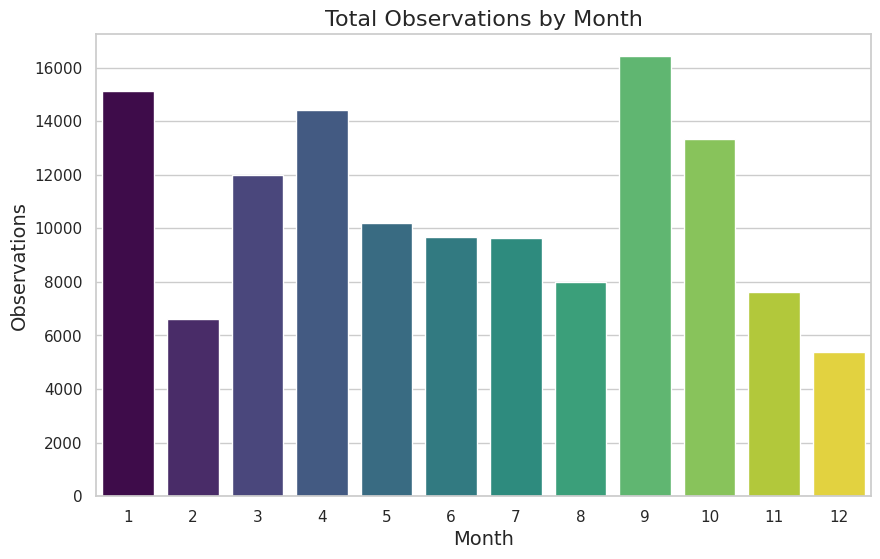

In [ ]:
count_by_month = df.groupby('month')['count'].sum().reset_index()

print(count_by_month)

sns.set(style="whitegrid")

# bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='month', y='count', data=count_by_month, palette='viridis', hue = 'month', legend=False)

# titles and labels
plt.title('Total Observations by Month', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Observations', fontsize=14)

# Show plot
plt.show()

2020 by far has the most observations

    year  count
0   1905      3
1   1938      2
2   1947      6
3   1950      2
4   1954      1
..   ...    ...
58  2017   7302
59  2018  10862
60  2019  11680
61  2020  23630
62  2021   7811

[63 rows x 2 columns]


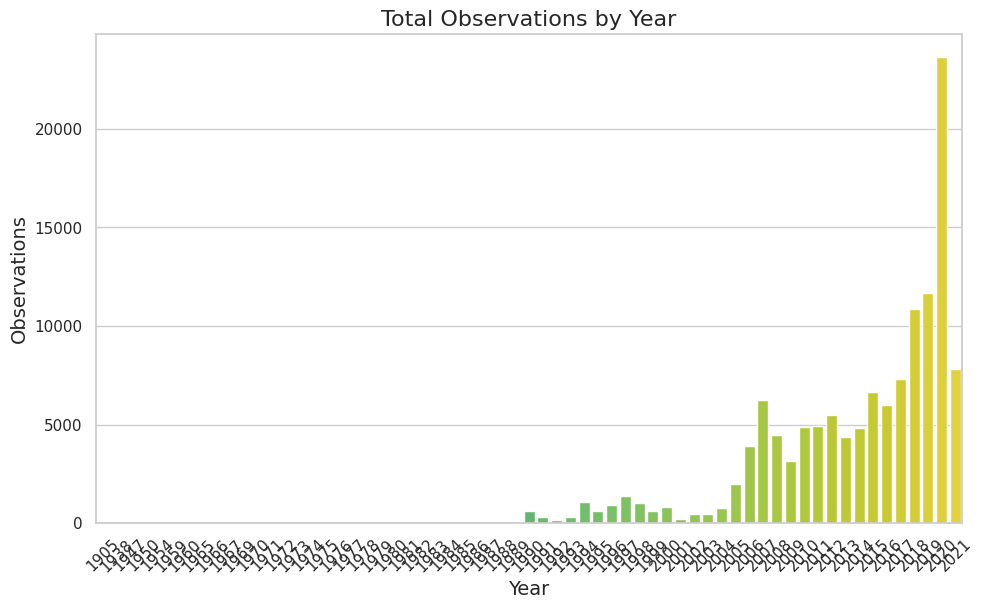

In [ ]:
count_by_year = df.groupby('year')['count'].sum().reset_index()

print(count_by_year)

sns.set(style="whitegrid")

# bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='year', y='count', data=count_by_year, palette='viridis', hue = 'year', legend=False)

plt.xticks(rotation=45)
plt.tight_layout()

# titles and labels
plt.title('Total Observations by Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Observations', fontsize=14)

# Show plot
plt.show()

Create the season feature

In [ ]:
# Create season
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Add season column to existing gdf
df['season'] = df['month'].apply(get_season)

# Analysis by season
print("Observations by Season:")
print(gdf['season'].value_counts())

Observations by Season:
season
Spring    25106
Autumn    22099
Summer    16953
Winter    10910
Name: count, dtype: int64


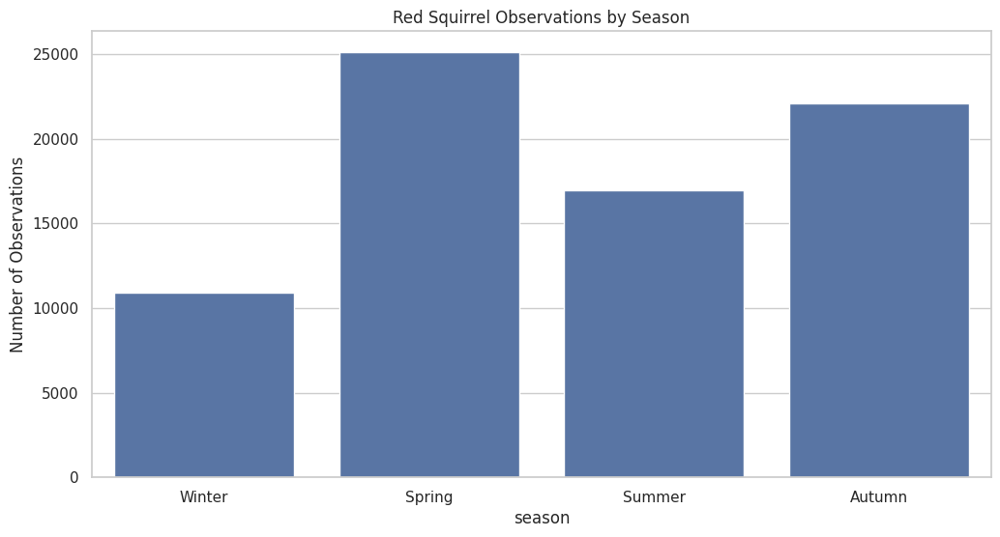

In [ ]:
import matplotlib.pyplot as plt

# Visualise seasonal patterns
plt.figure(figsize=(12, 6))
sns.countplot(data=gdf, x='season', order=['Winter', 'Spring', 'Summer', 'Autumn'])
plt.title('Red Squirrel Observations by Season')
plt.ylabel('Number of Observations')
plt.show()

In [ ]:
# Check the distribution
print("Observations by Season:")
print(df['season'].value_counts())

# Check months in the dataset
print("\nObservations by Month:")
print(df['month'].value_counts().sort_index())

Observations by Season:
season
Spring    28790
Autumn    27398
Summer    20751
Winter    16140
Name: count, dtype: int64

Observations by Month:
month
1      7767
2      4717
3      9407
4     11836
5      7547
6      7320
7      7359
8      6072
9     12043
10     9824
11     5531
12     3656
Name: count, dtype: int64


A heatmap of coordinate points of sightings for every day in January 2020

In [ ]:
import folium
from folium.plugins import HeatMap
from IPython.display import display

# Function to generate basemap for a specific day
def generate_basemap_for_day(year, month, day):
    df_day = df[(df['year'] == year) & (df['month'] == month) & (df['day'] == day)]
    basemap = folium.Map(location=[55.9533, -3.1883], zoom_start=6)
    HeatMap(data=df_day[['Latitude (WGS84)', 'Longitude (WGS84)']], radius=15).add_to(basemap)
    return basemap

# Looping through each day of the month and displaying the basemaps
for day in range(1, 32):
    basemap = generate_basemap_for_day(2020, 1, day)
    display(basemap)

 # Scroll down to see more days

Marker Cluster Anyalysis of sightings for every day in January 2020

In [ ]:
from folium.plugins import FastMarkerCluster
from IPython.display import display

# Function to generate basemap for a specific day
def generate_basemap_for_day(year, month, day):
    df_day = df[(df['year'] == year) & (df['month'] == month) & (df['day'] == day)]
    basemap = folium.Map(location=[55.9533, -3.1883], zoom_start=6)
    FastMarkerCluster(data=df_day[['Latitude (WGS84)', 'Longitude (WGS84)']], radius=15).add_to(basemap)
    return basemap

# Looping through each day of the month and displaying the basemaps
for day in range(1, 32):
    basemap = generate_basemap_for_day(2020, 1, day)
    display(basemap)

 # Scroll down to see more days

It may be better to use single sighting points as lone observations and use a shapefile of Scottish boundries to group these observations. The 'count' variable has too many entries from large surveys. This will also reduce the likelihood of the same squirrel being spotted twice.

Converting the coordinate data into a GeoDataFrame with geometry points and use those as predictors of populations.

In [ ]:
import geopandas as gpd

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude (WGS84)'], df['Latitude (WGS84)']))

Drop count

In [ ]:
gdf.drop('count', axis=1, inplace=True)

In [ ]:
print(gdf.head())

   Start date  day  month  year      OSGR  Latitude (WGS84)  \
0  16/07/2000   16      7  2000  NH922090         57.159619   
1  12/07/2010   12      7  2010    NO5198         57.074953   
2  15/07/2006   15      7  2006  NN025616         56.704684   
3  10/07/2018   10      7  2018    NY2369         55.014145   
4  16/07/2016   16      7  2016  NJ853015         57.104680   

   Longitude (WGS84)  Coordinate uncertainty (m) Occurrence ID  \
0          -3.783060                        70.7       DS17758   
1          -2.801609                       707.1        DS7168   
2          -5.227014                        70.7       DS30027   
3          -3.197849                       707.1      GR199796   
4          -2.243467                        70.7       OS13993   

           Survey key OSGR 100km OSGR 10km OSGR 2km OSGR 1km       Date  \
0             SNH2001         NH      NH90    NH90J   NH9209 2000-07-16   
1  NESBREC.2011.08.03         NO      NO59    NO59E   NO5198 2010-07-12   

Saving the Dataframe at this point to be imported into MongoDB

In [ ]:
# Filter data from 2010 to 2022
gdf_filtered = gdf[(gdf['year'] >= 2010) & (gdf['year'] <= 2022)].copy()

# Convert filtered GeoDataFrame to NDJSON format
with open('squirrel_points_2010_2022.jsonl', 'w') as f:
    for idx, row in gdf_filtered.iterrows():
        try:
            # Create document
            doc = {
                'geometry': {
                    'type': 'Point',
                    'coordinates': [float(row.geometry.x), float(row.geometry.y)]
                },
                'properties': {
                    'Start_date': str(row['Start_date']),
                    'day': int(row['day']),
                    'month': int(row['month']),
                    'year': int(row['year']),
                    'OSGR': str(row['OSGR']),
                    'Latitude': float(row['Latitude_WGS84']),
                    'Longitude': float(row['Longitude_WGS84']),
                    'Coordinate_uncertainty': float(row['Coordinate_uncertainty_m']),
                    'Occurrence_ID': str(row['Occurrence_ID']),
                    'Survey_key': str(row['Survey_key']),
                    'OSGR_100km': str(row['OSGR_100km']),
                    'OSGR_10km': str(row['OSGR_10km']),
                    'OSGR_2km': str(row['OSGR_2km']),
                    'OSGR_1km': str(row['OSGR_1km']),
                    'Date': row['Date'].strftime('%Y-%m-%d') if isinstance(row['Date'], pd.Timestamp) else str(row['Date']),
                    'season': str(row['season'])
                }
            }
            # Write each document on a new line
            f.write(json.dumps(doc) + '\n')
        except Exception as e:
            print(f"Error processing row {idx}: {e}")

print(f"Total records from 2010-2022: {len(gdf_filtered)}")
print("File saved as squirrel_points_2010_2022.jsonl")

Total records from 2010-2022: 75068
File saved as squirrel_points_2010_2022.jsonl


Creating a shapefile of Scottish boundries from https://spatialdata.gov.scot/geonetwork/srv/eng/catalog.search#/metadata/d93dbde9-6936-4245-9938-0ef41a5cc0e4

In [ ]:
shapefile_url = "https://geo.spatialhub.scot/geoserver/sh_las/wfs?service=WFS&authkey=KEYHERE&request=GetFeature&typeName=sh_las:pub_las&format_options=filename:Local_Authority_Boundaries_-_Scotland&outputFormat=application/json"
shapefile_gdf = gpd.read_file(shapefile_url)

Checking the first 5 rows

In [ ]:
shapefile_gdf.head()

,id,local_authority,code,hectares,geometry
0,pub_las.1,Angus,S12000041,220244.68,"MULTIPOLYGON (((316464.998 776753.496, 316489...."
1,pub_las.2,Clackmannanshire,S12000005,16391.19,"MULTIPOLYGON (((291801.173 688448.131, 291468...."
2,pub_las.3,Dundee City,S12000042,6241.03,"MULTIPOLYGON (((332974.703 731066.604, 332829...."
3,pub_las.4,East Ayrshire,S12000008,127034.56,"MULTIPOLYGON (((241287.603 653032.301, 241301...."
4,pub_las.5,East Dunbartonshire,S12000045,17448.94,"MULTIPOLYGON (((250190.703 678031.705, 250198...."


Ensuring both GeoDataFrames use the same coordinate reference system (CRS)

In [ ]:
gdf = gdf.set_crs("EPSG:4326")
shapefile_gdf = shapefile_gdf.to_crs("EPSG:4326")

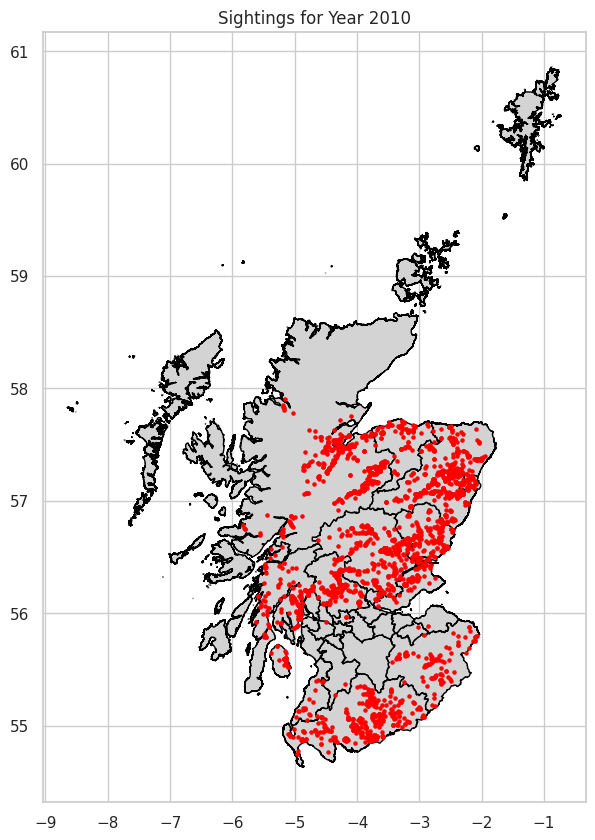

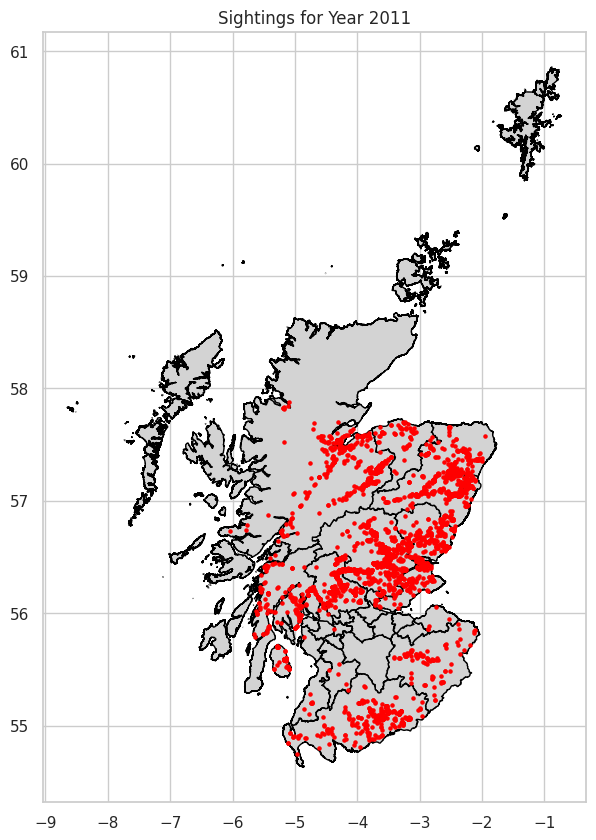

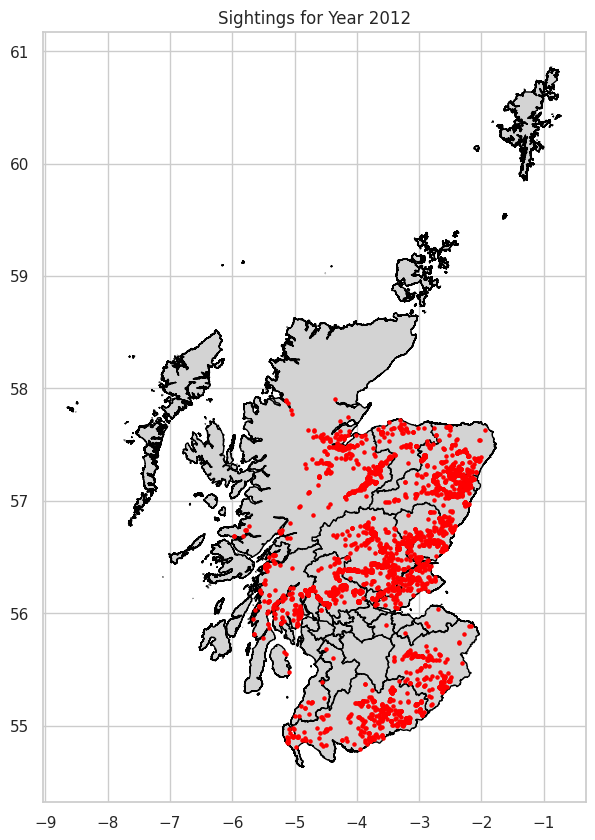

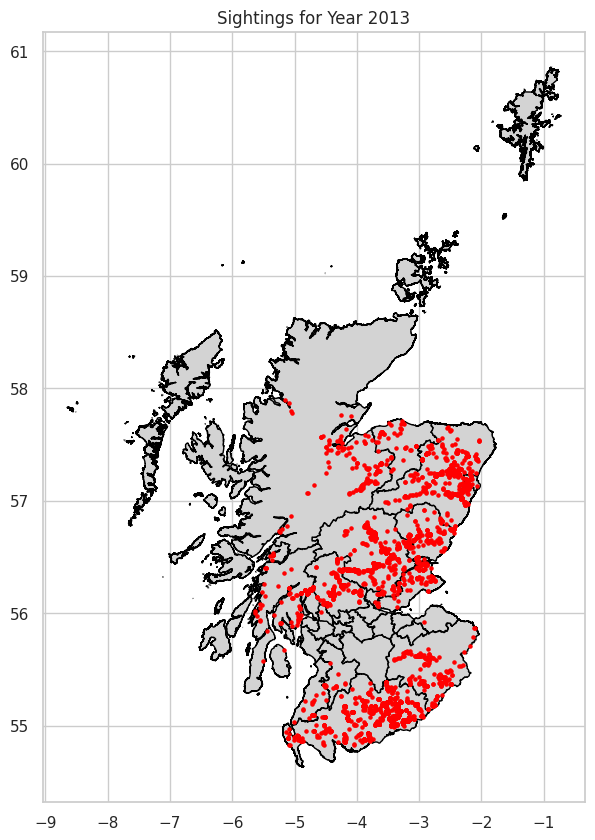

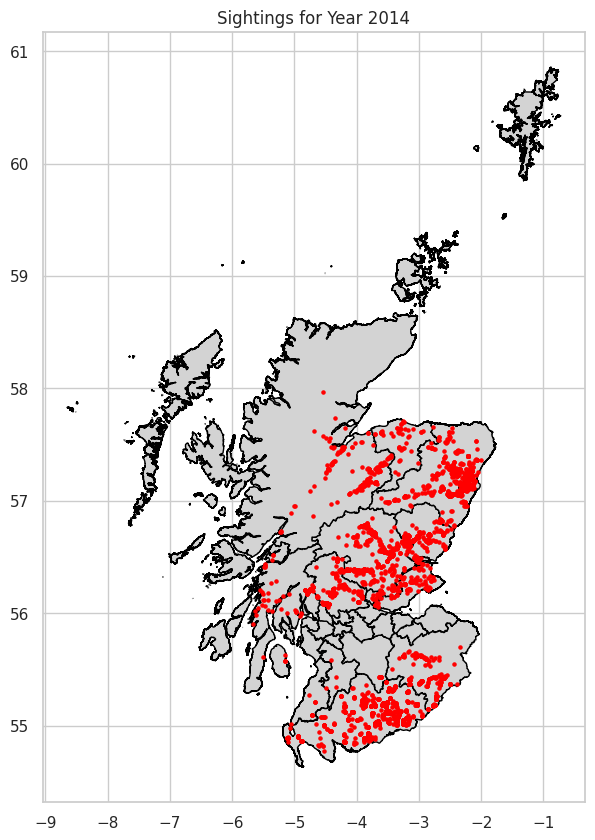

...

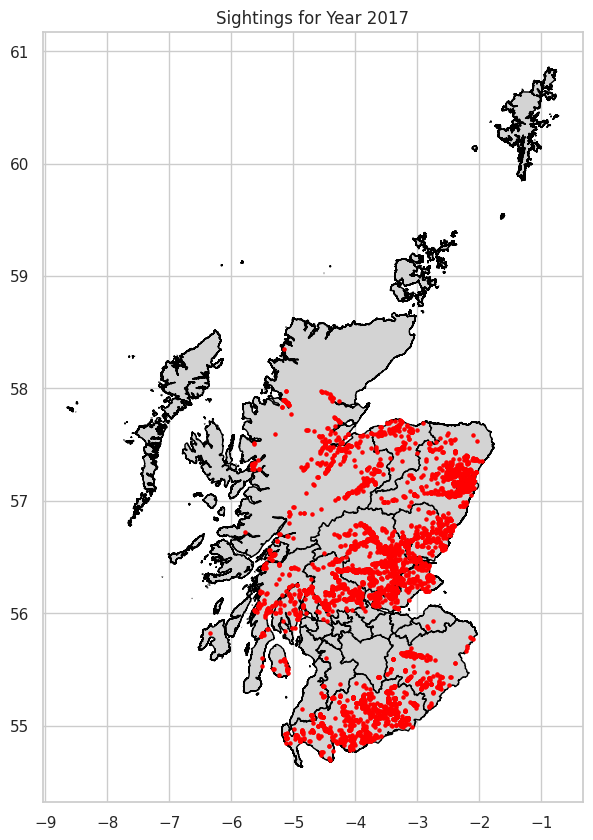

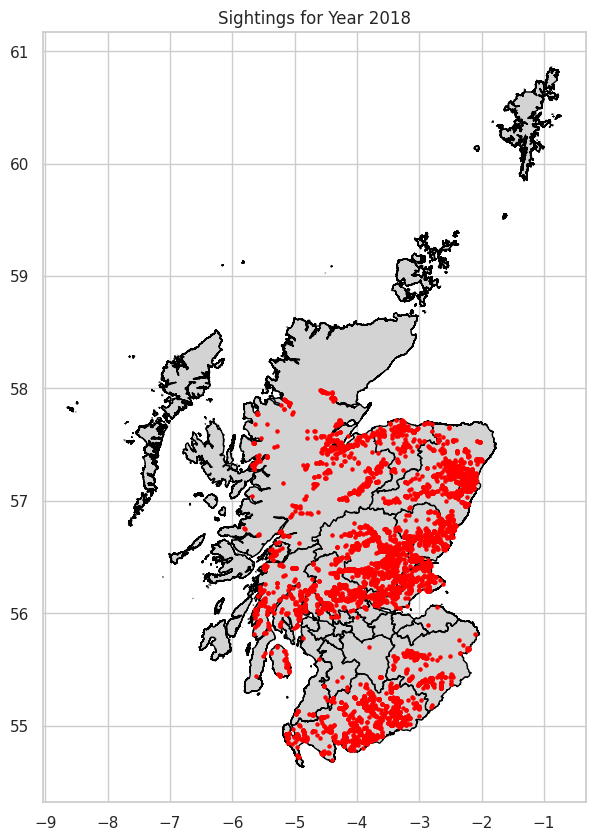

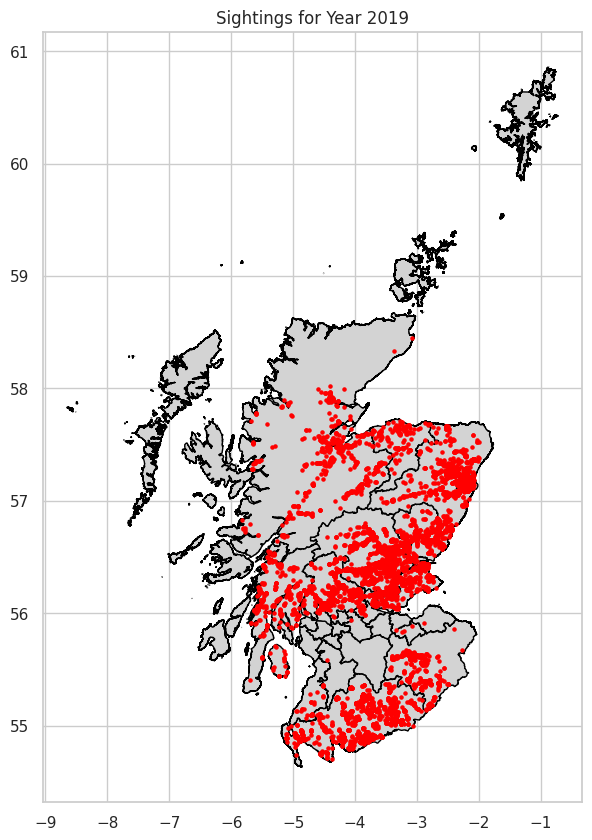

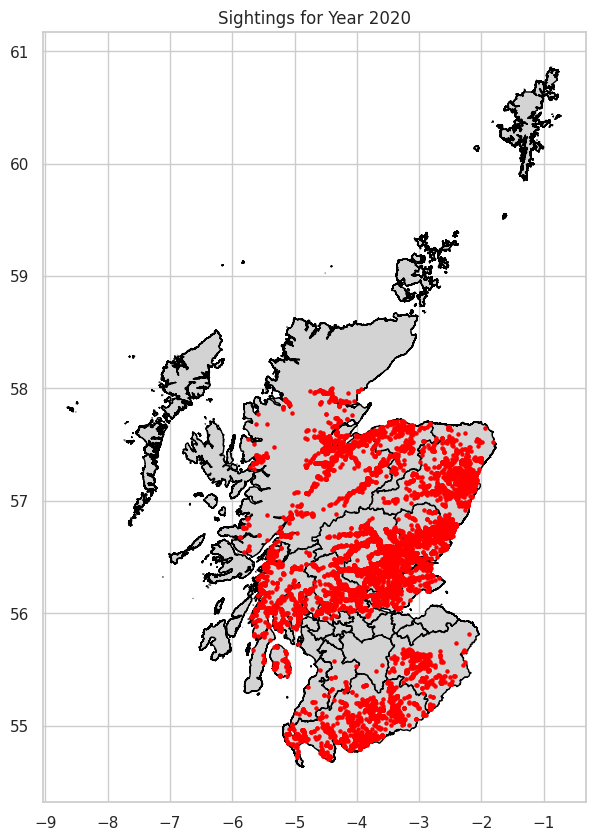

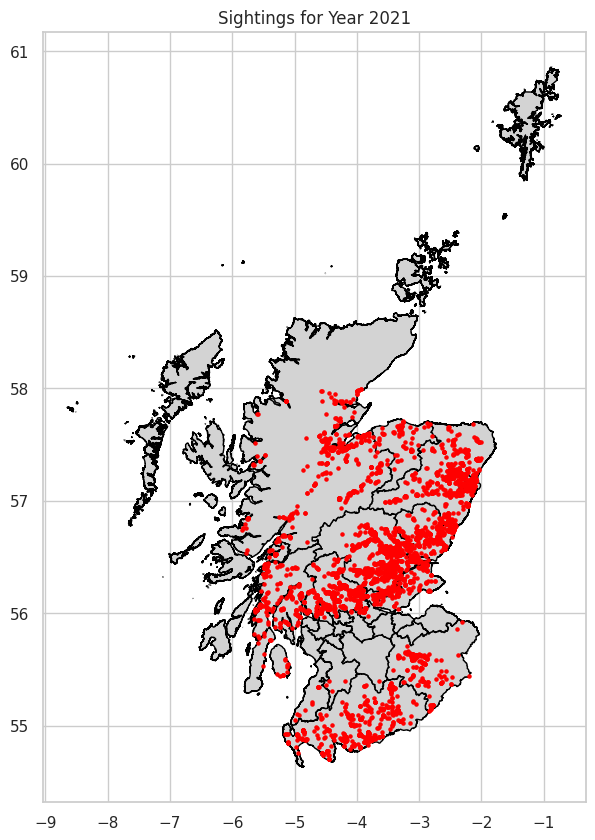

       Start date  day  month  year          OSGR  Latitude (WGS84)  \
1      05/07/2019    5      7  2019  NN9769626960         56.423724   
2      20/07/2014   20      7  2014    NJ95233143         57.373344   
3      10/07/2021   10      7  2021      NN524015         56.183655   
5      04/07/2019    4      7  2019      NS436906         56.083011   
6      20/07/2020   20      7  2020      NO381543         56.676797   
...           ...  ...    ...   ...           ...               ...   
93114  25/04/2014   25      4  2014  NO4847850320         56.641850   
93115  02/04/2020    2      4  2020      NO114329         56.480304   
93116  20/04/2010   20      4  2010      NH768010         57.083925   
93117  15/04/2018   15      4  2018  NO1255943721         56.577248   
93118  03/04/2017    3      4  2017  NN6283008407         56.248318   

       Longitude (WGS84)  Coordinate uncertainty (m)  count Occurrence ID  \
1              -3.660165                         0.7      1      DS229

In [ ]:
import pandas as pd
import pymongo
from pymongo import MongoClient
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

gdf = gdf[(gdf['year'] >= 2010) & (gdf['year'] <= 2021)]

joined_gdf = gpd.sjoin(gdf, shapefile_gdf, how = "inner", predicate = "within")

for year, group in joined_gdf.groupby('year'):
    fig, ax = plt.subplots(figsize = (10, 10))
    shapefile_gdf.plot(ax = ax, color='lightgrey', edgecolor = 'black')
    group.plot(ax = ax, color = 'red', markersize= 5 )
    plt.title(f"Sightings for Year {year}")
    plt.show()

print(joined_gdf)


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Spatial join
joined_gdf = gpd.sjoin(gdf, shapefile_gdf, how="inner", predicate="within")

# Counting the number of points within the boundaries per year and local authority
points_per_year_authority = joined_gdf.groupby(['year', 'local_authority']).size().reset_index(name='Sightings')

print(points_per_year_authority)

     year      local_authority  Sightings
0    2010        Aberdeen City         66
1    2010        Aberdeenshire        569
2    2010                Angus        163
3    2010      Argyll and Bute        335
4    2010     Clackmannanshire         12
..    ...                  ...        ...
235  2021     Scottish Borders        225
236  2021       South Ayrshire         11
237  2021    South Lanarkshire          1
238  2021             Stirling        825
239  2021  West Dunbartonshire         65

[240 rows x 3 columns]


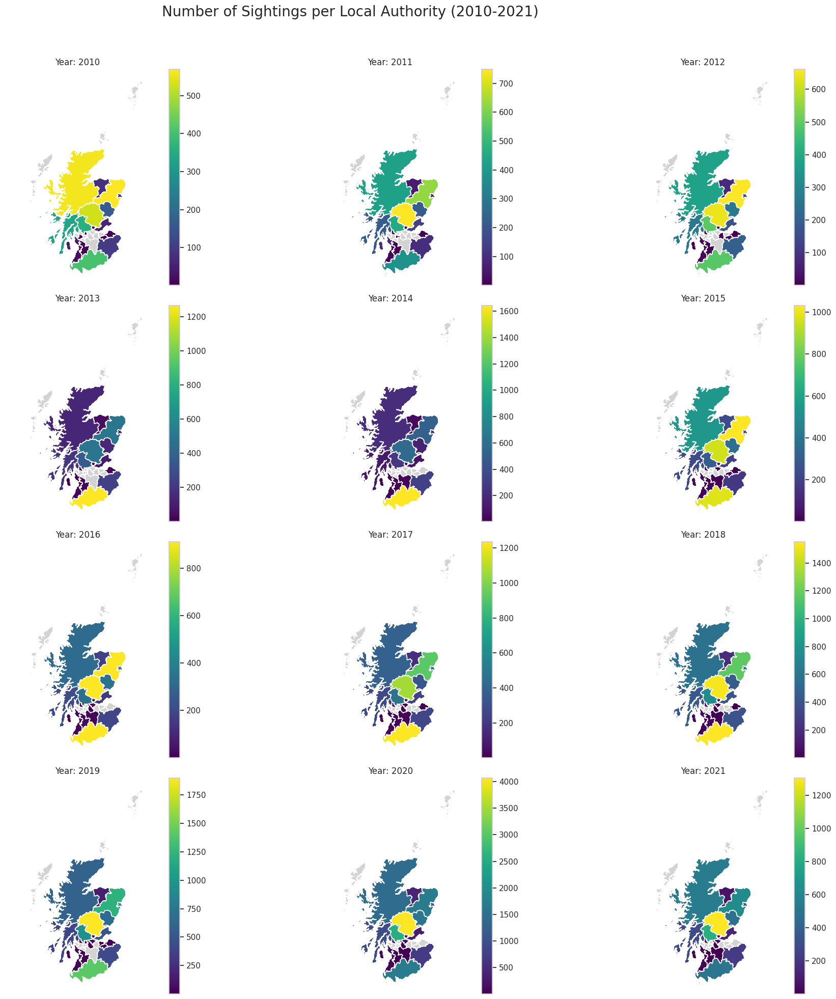

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt


# Plot
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 20), sharex=True, sharey=True)
axes = axes.flatten()

for i, year in enumerate(range(2010, 2022)):
    ax = axes[i]
    yearly_data = points_per_year_authority[points_per_year_authority['year'] == year]
    merged_gdf = shapefile_gdf.merge(yearly_data, left_on='local_authority', right_on='local_authority', how='left')
    merged_gdf.plot(column='Sightings', ax=ax, legend=True, cmap='viridis', missing_kwds={"color": "lightgrey"})
    ax.set_title(f'Year: {year}')
    ax.set_axis_off()

plt.suptitle('Number of Sightings per Local Authority (2010-2021)', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [ ]:
import pandas as pd
import pymongo
from pymongo import MongoClient
import geopandas as gpd
import folium
from folium.features import GeoJsonTooltip

# select year
gdf_2020 = gdf[(gdf['year'] == 2020)]


joined_gdf = gpd.sjoin(gdf, shapefile_gdf, how="inner", predicate="within")


region_data = joined_gdf.groupby('local_authority').size().reset_index(name='Sightings')

# Merge with shapefile data
choropleth_gdf = shapefile_gdf.merge(region_data, left_on='local_authority', right_on='local_authority', how='left')

# folium map
m = folium.Map(location=[54.5, -3], zoom_start=6)

# choropleth layer
folium.Choropleth(
    geo_data=choropleth_gdf,
    name='choropleth',
    data=choropleth_gdf,
    columns=['local_authority', 'Sightings'],
    key_on='feature.properties.local_authority',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Sightings'
).add_to(m)

# tooltips
tooltip = GeoJsonTooltip(
    fields=['local_authority', 'Sightings'],
    aliases=['Local Authority:', 'Sightings:'],
    localize=True
)

folium.GeoJson(
    choropleth_gdf,
    tooltip=tooltip
).add_to(m)

# This will save an interactive map to a HTML file in Colab that you can download and view (folder icon)
m.save('choropleth_map.html')



In [ ]:
import pandas as pd
import pymongo
from pymongo import MongoClient
import geopandas as gpd
import folium
from folium.features import GeoJsonTooltip

# range of years (2010-2022)
years = range(2010, 2022)

for year in years:
    # Filter data for the specific year
    yearly_gdf = gdf[gdf['year'] == year]

    # spatial join
    joined_gdf = gpd.sjoin(yearly_gdf, shapefile_gdf, how="inner", predicate="within")

    # data by region
    region_data = joined_gdf.groupby('local_authority').size().reset_index(name='Sightings')
    print(f"Region data for {year}:\n", region_data.head())

    # Merge with shapefile data
    choropleth_gdf = shapefile_gdf.merge(region_data, left_on='local_authority', right_on='local_authority', how='left')
    print(f"Choropleth data for {year}:\n", choropleth_gdf.head())

    # folium map
    m = folium.Map(location=[54.5, -3], zoom_start=6)

    # choropleth layer
    folium.Choropleth(
        geo_data=choropleth_gdf,
        name='choropleth',
        data=choropleth_gdf,
        columns=['local_authority', 'Sightings'],
        key_on='feature.properties.local_authority',
        fill_color='YlOrRd',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Sightings {year}'
    ).add_to(m)

    # tooltips
    tooltip = GeoJsonTooltip(
        fields=['local_authority', 'Sightings'],
        aliases=['Local Authority:', 'Sightings:'],
        localize=True
    )

    folium.GeoJson(
        choropleth_gdf,
        tooltip=tooltip
    ).add_to(m)

    # This will save a series of interactive maps to a HTML file in Colab that you can download and view (folder icon)
    m.save(f'choropleth_map_{year}.html')



Region data for 2010:
     local_authority  Sightings
0     Aberdeen City         66
1     Aberdeenshire        569
2             Angus        163
3   Argyll and Bute        335
4  Clackmannanshire         12
Choropleth data for 2010:
           id      local_authority       code   hectares  \
0  pub_las.1                Angus  S12000041  220244.68   
1  pub_las.2     Clackmannanshire  S12000005   16391.19   
2  pub_las.3          Dundee City  S12000042    6241.03   
3  pub_las.4        East Ayrshire  S12000008  127034.56   
4  pub_las.5  East Dunbartonshire  S12000045   17448.94   

                                            geometry  Sightings  
0  MULTIPOLYGON (((-3.37214 56.87463, -3.37174 56...      163.0  
1  MULTIPOLYGON (((-3.73992 56.07657, -3.74508 56...       12.0  
2  MULTIPOLYGON (((-3.08942 56.46695, -3.09187 56...       29.0  
3  MULTIPOLYGON (((-4.52992 55.74458, -4.52972 55...        4.0  
4  MULTIPOLYGON (((-4.40205 55.97183, -4.40193 55...        2.0  
Region data f

In [ ]:
joined_gdf.head()

,Start date,day,month,year,OSGR,Latitude (WGS84),Longitude (WGS84),Coordinate uncertainty (m),count,Occurrence ID,...,OSGR 10km,OSGR 2km,OSGR 1km,Date,geometry,index_right,id,local_authority,code,hectares
3,10/07/2021,10,7,2021,NN524015,56.183655,-4.378865,70.7,3,NS44193,...,NN50,NN50F,NN5201,2021-07-10,POINT (-4.37886 56.18366),15,pub_las.16,Stirling,S12000030,225481.60
28,08/07/2021,8,7,2021,NJ611449,57.493096,-2.649765,70.7,1,NS44185,...,NJ64,NJ64C,NJ6144,2021-07-08,POINT (-2.64976 57.4931),22,pub_las.23,Aberdeenshire,S12000034,633842.98
48,01/07/2021,1,7,2021,NN870657,56.769597,-3.849609,70.7,2,NS44098,...,NN86,NN86S,NN8765,2021-07-01,POINT (-3.84961 56.7696),11,pub_las.12,Perth and Kinross,S12000048,542136.33
62,17/07/2021,17,7,2021,NS229930,56.097330,-4.847902,70.7,1,NS44383,...,NS29,NS29G,NS2293,2021-07-17,POINT (-4.8479 56.09733),21,pub_las.22,Argyll and Bute,S12000035,716614.27
114,05/07/2021,5,7,2021,NX633784,55.081624,-4.142199,70.7,1,NS43931,...,NX67,NX67J,NX6378,2021-07-05,POINT (-4.1422 55.08162),29,pub_las.30,Dumfries and Galloway,S12000006,667525.68


Per week

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# data for the specific year (2021)
df = df[df['year'] == 2021].copy()


# Create a new column for the week number
df['week'] = df['Date'].dt.isocalendar().week

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude (WGS84)'], df['Latitude (WGS84)']))

# Load the shapefile
shapefile_url = "https://geo.spatialhub.scot/geoserver/sh_las/wfs?service=WFS&authkey=KEYHERE&request=GetFeature&typeName=sh_las:pub_las&format_options=filename:Local_Authority_Boundaries_-_Scotland&outputFormat=application/json"
shapefile_gdf = gpd.read_file(shapefile_url)

# Ensure both GeoDataFrames use the same coordinate reference system (CRS)
gdf = gdf.set_crs("EPSG:4326")
shapefile_gdf = shapefile_gdf.to_crs("EPSG:4326")

# Perform a spatial join to find which points fall within the shapefile boundaries
joined_gdf = gpd.sjoin(gdf, shapefile_gdf, how="inner", predicate="within")

# Count the number of points within the boundaries per week and local authority name
points_per_week_authority = joined_gdf.groupby(['week', 'local_authority']).size().reset_index(name='Sightings')

print(points_per_week_authority)


<ipython-input-62-a4792d2eb285>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['week'] = df['Date'].dt.isocalendar().week


     week      local_authority  Sightings
0       1        Aberdeen City          7
1       1        Aberdeenshire         29
2       1                Angus         24
3       1      Argyll and Bute          8
4       1     Clackmannanshire          6
..    ...                  ...        ...
478    53    Perth and Kinross         39
479    53     Scottish Borders          6
480    53       South Ayrshire          1
481    53             Stirling          5
482    53  West Dunbartonshire          1

[483 rows x 3 columns]


In [ ]:
print(shapefile_gdf.head())

          id      local_authority       code   hectares  \
0  pub_las.1                Angus  S12000041  220244.68   
1  pub_las.2     Clackmannanshire  S12000005   16391.19   
2  pub_las.3          Dundee City  S12000042    6241.03   
3  pub_las.4        East Ayrshire  S12000008  127034.56   
4  pub_las.5  East Dunbartonshire  S12000045   17448.94   

                                            geometry  
0  MULTIPOLYGON (((-3.37214 56.87463, -3.37174 56...  
1  MULTIPOLYGON (((-3.73992 56.07657, -3.74508 56...  
2  MULTIPOLYGON (((-3.08942 56.46695, -3.09187 56...  
3  MULTIPOLYGON (((-4.52992 55.74458, -4.52972 55...  
4  MULTIPOLYGON (((-4.40205 55.97183, -4.40193 55...  


In [ ]:
print(joined_gdf.head())

     Start date  day  month  year      OSGR  Latitude (WGS84)  \
3    10/07/2021   10      7  2021  NN524015         56.183655   
28   08/07/2021    8      7  2021  NJ611449         57.493096   
48   01/07/2021    1      7  2021  NN870657         56.769597   
62   17/07/2021   17      7  2021  NS229930         56.097330   
114  05/07/2021    5      7  2021  NX633784         55.081624   

     Longitude (WGS84)  Coordinate uncertainty (m) Occurrence ID Survey key  \
3            -4.378865                        70.7       NS44193   SSRSWEB1   
28           -2.649765                        70.7       NS44185   SSRSWEB1   
48           -3.849609                        70.7       NS44098   SSRSWEB1   
62           -4.847902                        70.7       NS44383   SSRSWEB1   
114          -4.142199                        70.7       NS43931   SSRSWEB1   

     ... OSGR 2km OSGR 1km       Date week                   geometry  \
3    ...    NN50F   NN5201 2021-07-10   27  POINT (-4.37886 5

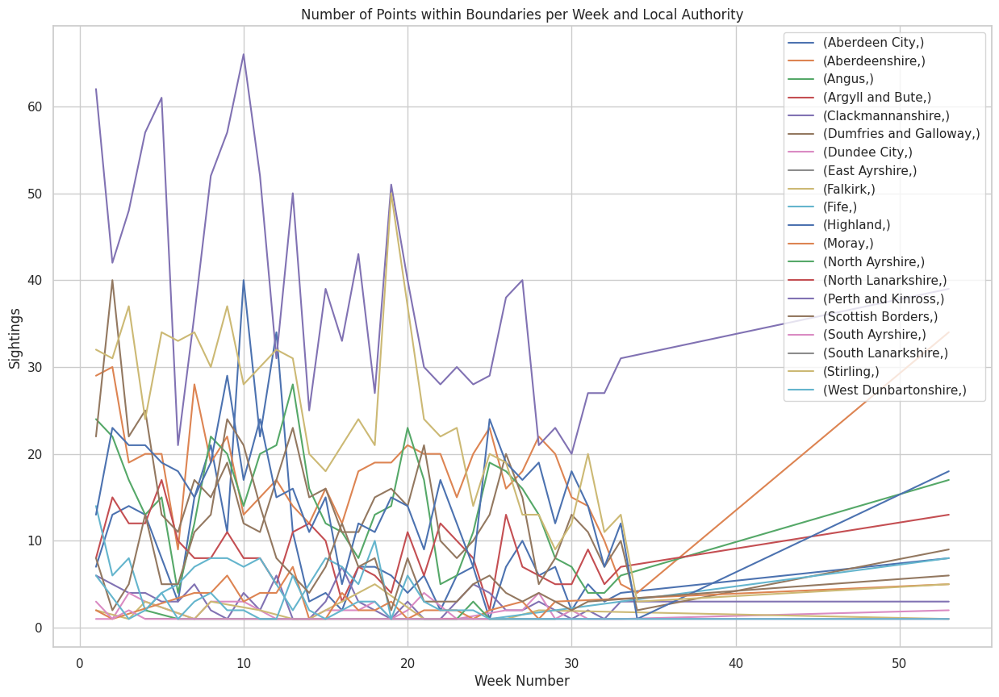

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

# data for the specific year (2021)
df = df[df['year'] == 2021]

# column for the week number
df['week'] = df['Date'].dt.isocalendar().week

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude (WGS84)'], df['Latitude (WGS84)']))

# shapefile
shapefile_url = "https://geo.spatialhub.scot/geoserver/sh_las/wfs?service=WFS&authkey=KEYHERE&request=GetFeature&typeName=sh_las:pub_las&format_options=filename:Local_Authority_Boundaries_-_Scotland&outputFormat=application/json"
shapefile_gdf = gpd.read_file(shapefile_url)

# Ensure both GeoDataFrames use the same coordinate reference system (CRS)
gdf = gdf.set_crs("EPSG:4326")
shapefile_gdf = shapefile_gdf.to_crs("EPSG:4326")

# spatial join
joined_gdf = gpd.sjoin(gdf, shapefile_gdf, how="inner", predicate="within")

# number of points within the boundaries per week
points_per_week_authority = joined_gdf.groupby(['week', 'local_authority']).size().reset_index(name='Sightings')

# Plot
fig, ax = plt.subplots(figsize=(15, 10))
for key, grp in points_per_week_authority.groupby(['local_authority']):
    ax = grp.plot(ax=ax, kind='line', x='week', y='Sightings', label=key)

plt.legend(loc='best')
plt.title('Number of Points within Boundaries per Week and Local Authority')
plt.xlabel('Week Number')
plt.ylabel('Sightings')
plt.show()


There are weeks missing

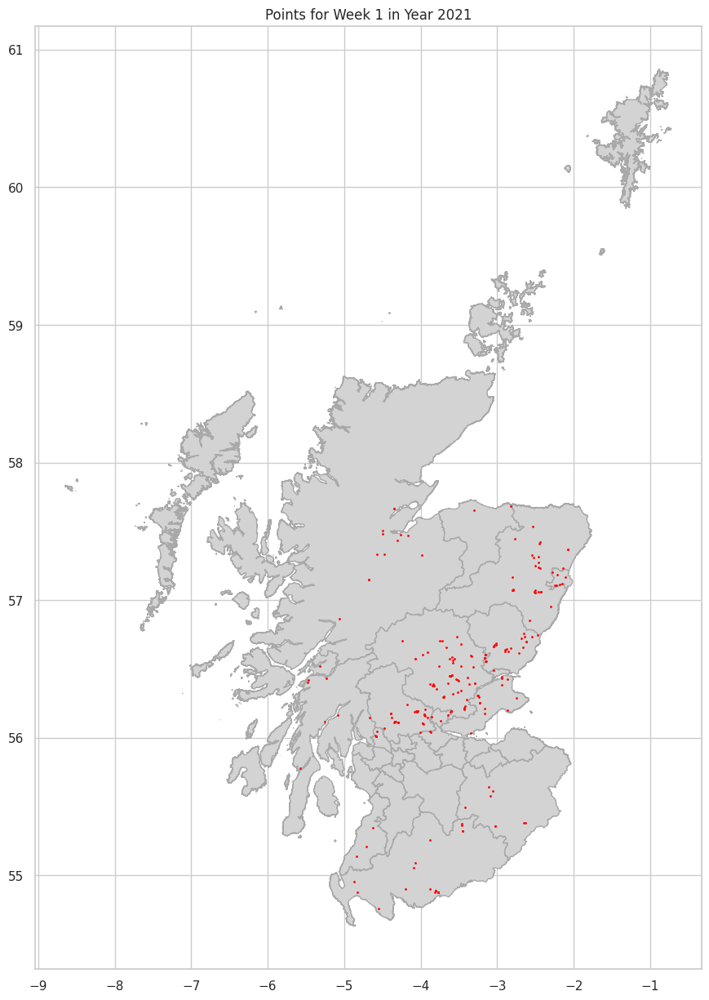

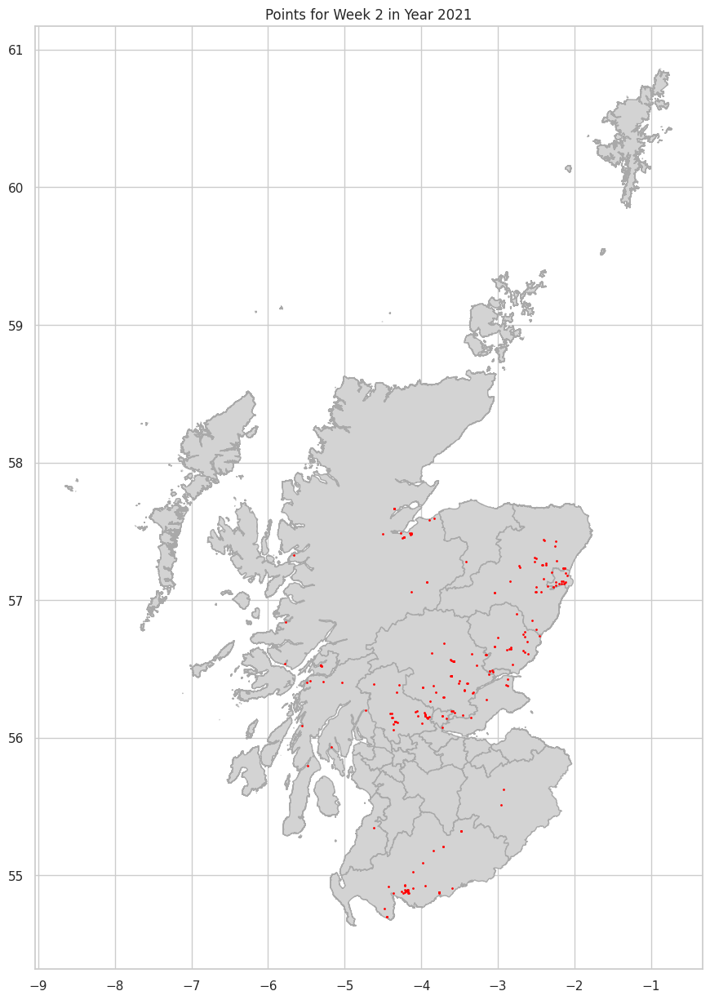

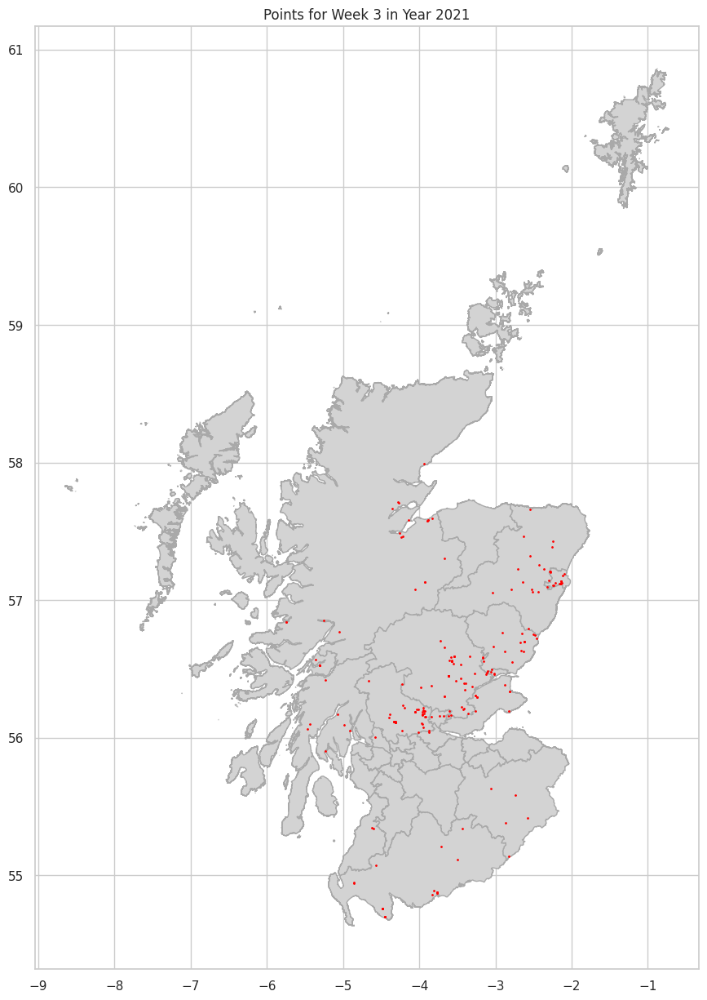

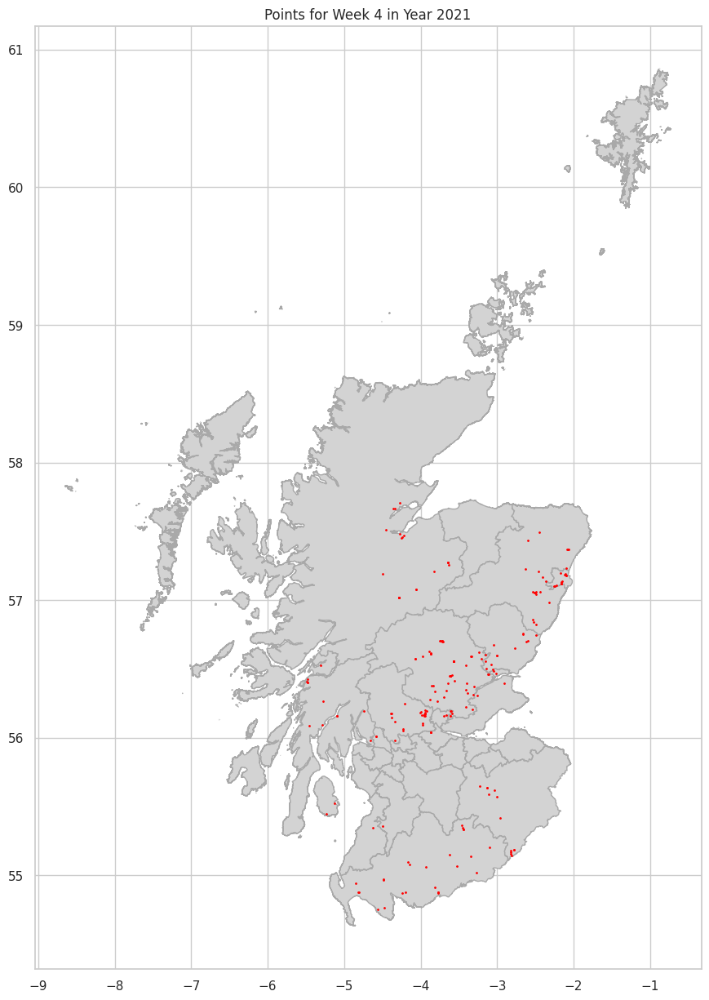

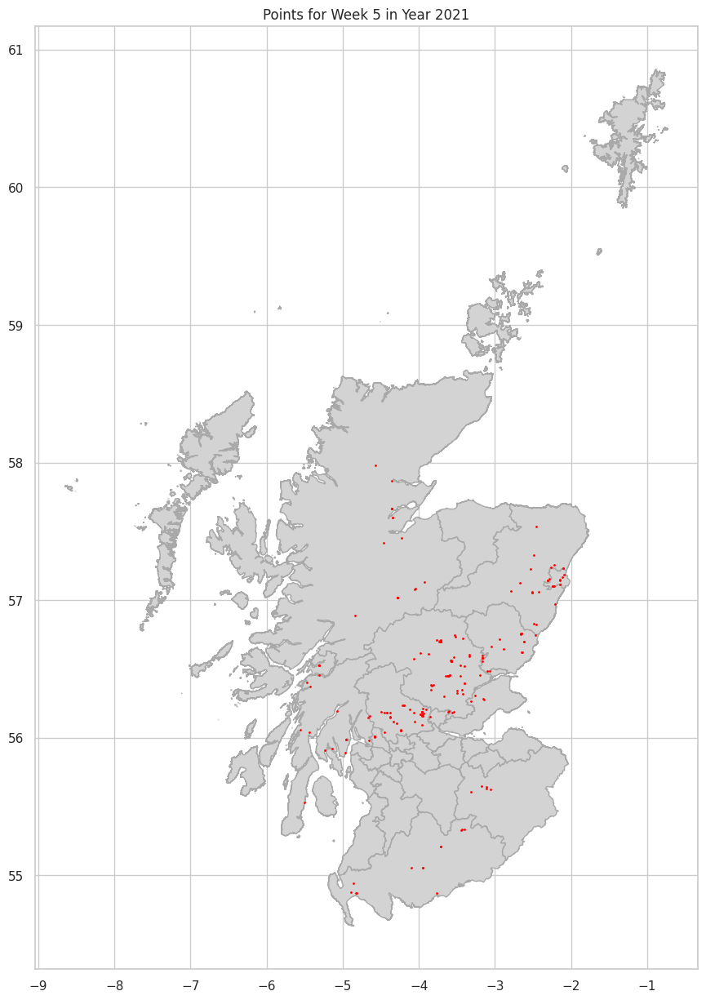

...

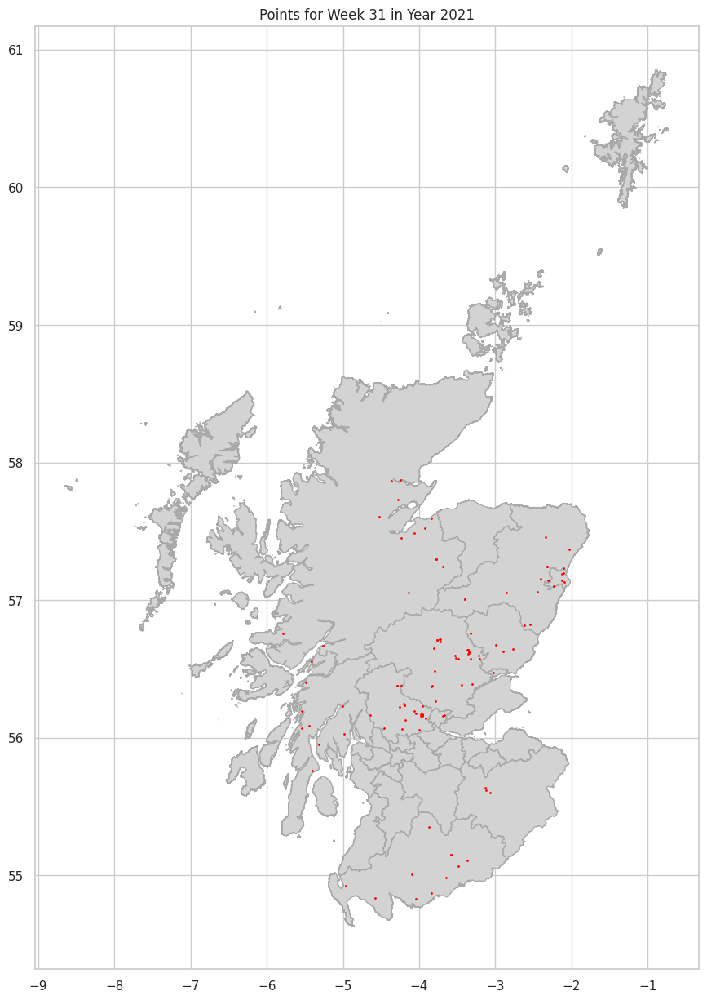

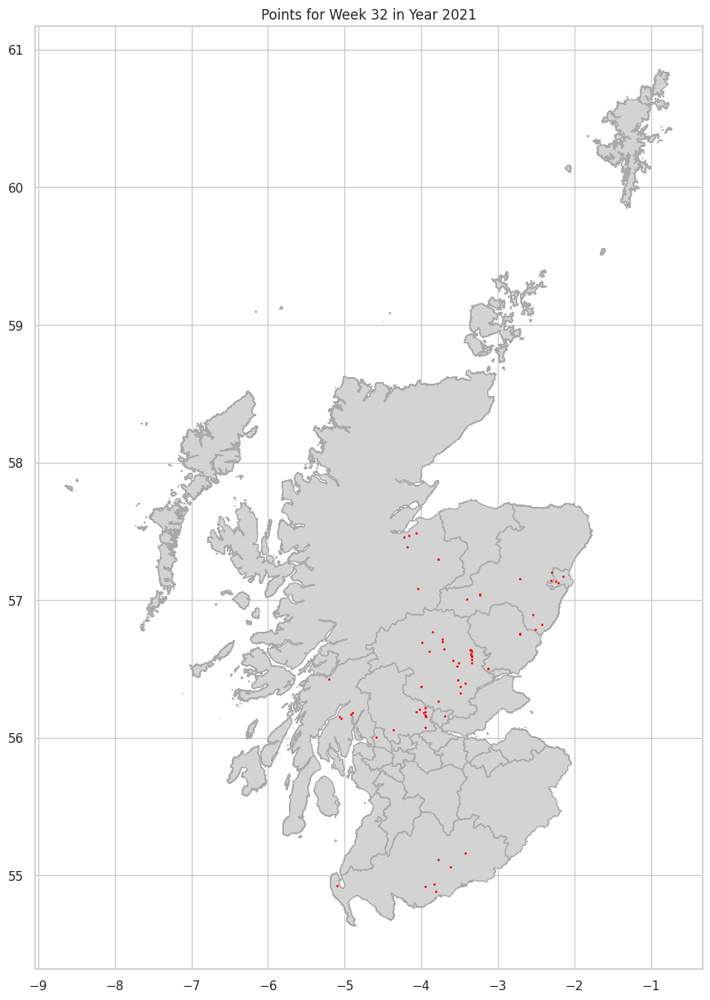

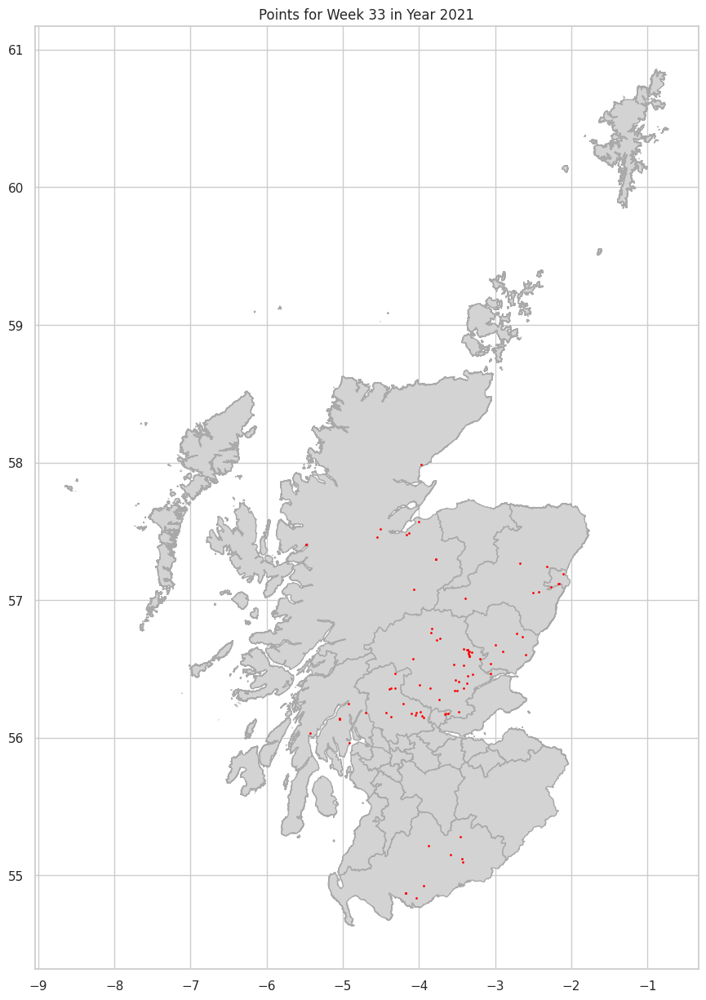

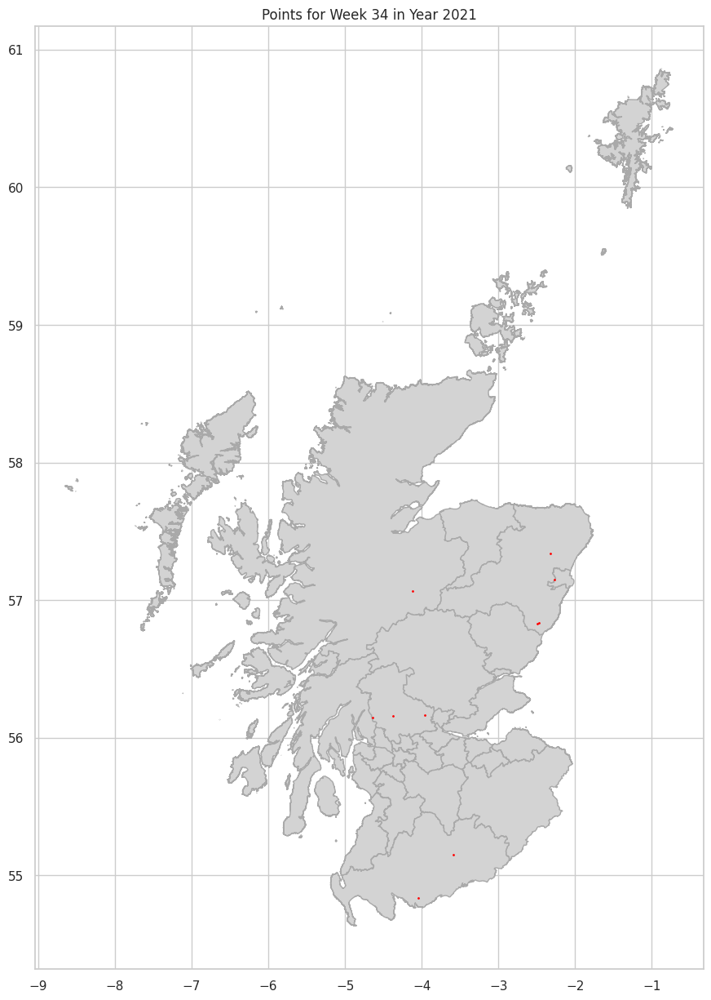

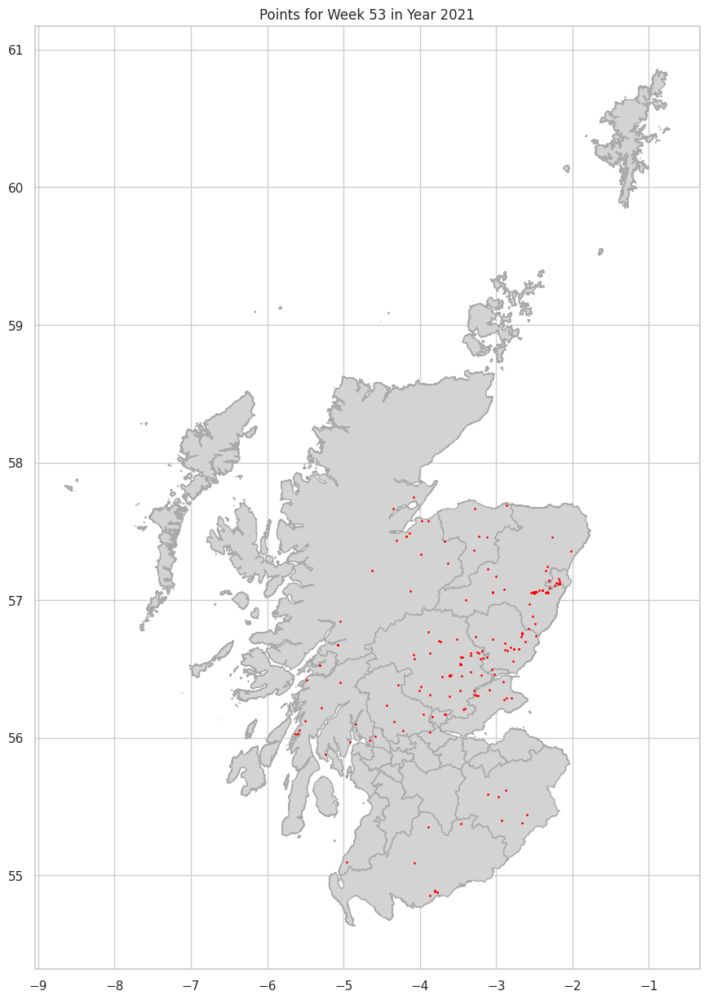

       Start date  day  month  year      OSGR  Latitude (WGS84)  \
3      10/07/2021   10      7  2021  NN524015         56.183655   
28     08/07/2021    8      7  2021  NJ611449         57.493096   
48     01/07/2021    1      7  2021  NN870657         56.769597   
62     17/07/2021   17      7  2021  NS229930         56.097330   
114    05/07/2021    5      7  2021  NX633784         55.081624   
...           ...  ...    ...   ...       ...               ...   
93023  08/04/2021    8      4  2021  NO594492         56.633320   
93052  07/04/2021    7      4  2021  NO004012         56.193420   
93071  27/04/2021   27      4  2021  NN855236         56.391212   
93075  17/04/2021   17      4  2021  NN598089         56.252323   
93088  03/04/2021    3      4  2021  NO140284         56.440370   

       Longitude (WGS84)  Coordinate uncertainty (m) Occurrence ID Survey key  \
3              -4.378865                        70.7       NS44193   SSRSWEB1   
28             -2.649765         

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

# data for the specific year (2021)
specific_year = 2021
df = df[df['year'] == specific_year]

# new column for the week number
df['week'] = df['Date'].dt.isocalendar().week

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude (WGS84)'], df['Latitude (WGS84)']))

# Load the shapefile
shapefile_url = "https://geo.spatialhub.scot/geoserver/sh_las/wfs?service=WFS&authkey=KEYHERE&request=GetFeature&typeName=sh_las:pub_las&format_options=filename:Local_Authority_Boundaries_-_Scotland&outputFormat=application/json"
shapefile_gdf = gpd.read_file(shapefile_url)

# Ensure both GeoDataFrames use the same coordinate reference system (CRS)
gdf = gdf.set_crs("EPSG:4326")
shapefile_gdf = shapefile_gdf.to_crs("EPSG:4326")

# spatial join
joined_gdf = gpd.sjoin(gdf, shapefile_gdf, how="inner", predicate="within")

# Plot the data by week
for week, group in joined_gdf.groupby('week'):
    fig, ax = plt.subplots(figsize=(15, 15))
    shapefile_gdf.plot(ax=ax, color='lightgrey', edgecolor='darkgrey')
    group.plot(ax=ax, color='red', markersize=1)
    plt.title(f"Points for Week {week} in Year {specific_year}")
    plt.show()
    plt.close()

print(joined_gdf)

print(joined_gdf['week'].unique())



In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# data for the specific year (2021)
df = df[df['year'] == 2021]


# new column for the week number
df['week'] = df['Date'].dt.isocalendar().week

# Counting the number of points within the boundaries per week and local authority name
points_per_week_authority = joined_gdf.groupby(['week', 'local_authority']).size().reset_index(name='Sightings')

pd.set_option('display.max_rows', None)
print(points_per_week_authority)

     week        local_authority  Sightings
0       1          Aberdeen City          7
1       1          Aberdeenshire         29
2       1                  Angus         24
3       1        Argyll and Bute          8
4       1       Clackmannanshire          6
5       1  Dumfries and Galloway         22
6       1            Dundee City          1
7       1                Falkirk          2
8       1                   Fife         14
9       1               Highland         13
10      1                  Moray          2
11      1      Perth and Kinross         62
12      1       Scottish Borders          8
13      1         South Ayrshire          3
14      1               Stirling         32
15      1    West Dunbartonshire          6
16      2          Aberdeen City         13
17      2          Aberdeenshire         30
18      2                  Angus         22
19      2        Argyll and Bute         15
20      2       Clackmannanshire          5
21      2  Dumfries and Galloway

As the Boundary data is accurate and has proven useful we can upload it to MongoDB

In [ ]:
# Install required packages
!pip install pymongo
!pip install geopandas
!pip install dnspython

# Packages
import geopandas as gpd
from dotenv import load_dotenv
from pymongo import MongoClient
import json

# Get boundaries with geometry from URL
shapefile_url = "https://geo.spatialhub.scot/geoserver/sh_las/wfs?service=WFS&authkey=KEYHERE&request=GetFeature&typeName=sh_las:pub_las&format_options=filename:Local_Authority_Boundaries_-_Scotland&outputFormat=application/json"
boundaries_gdf = gpd.read_file(shapefile_url)

# Set CRS and convert to WGS84
boundaries_gdf = boundaries_gdf.set_crs("EPSG:27700")  # British National Grid
boundaries_gdf = boundaries_gdf.to_crs("EPSG:4326")    # Convert to WGS84

# Convert to GeoJSON format
boundaries_json = json.loads(boundaries_gdf.to_json())

load_dotenv()

# Connect to MongoDB securely
connection_string = os.getenv("MONGODB_URI")
if not connection_string:
    raise ValueError("MongoDB URI not found. Check your .env file.")

client = MongoClient(connection_string)
db = client['Scottish_Boundaries']
collection = db['Boundary_data']

# Clear existing data
deleted_count = collection.delete_many({}).deleted_count
print(f"Cleared {deleted_count} existing documents")

# Upload each feature
inserted_count = 0
for feature in boundaries_json['features']:
    collection.insert_one(feature)
    inserted_count += 1

print(f"Uploaded {inserted_count} boundary features")
